<a href="https://colab.research.google.com/github/adiladnan327/adilbishop/blob/master/Statistical_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
#import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Machine Learning Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
#from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix

In [2]:
from google.colab import files # Use to load data on Google Colab
uploaded = files.upload() # Use to load data on Google Colab
df = pd.read_csv('HCV-Egy-Data.csv')
df.head(7)

Saving HCV-Egy-Data.csv to HCV-Egy-Data.csv


,Age,Gender,BMI,Fever,Nausea/Vomting,Headache,Diarrhea,Fatigue & generalized bone ache,Jaundice,Epigastric_pain,WBC,RBC,HGB,Plat,AST 1,ALT 1,ALT4,ALT 12,ALT 24,ALT 36,ALT 48,ALT after 24 w,RNA_Base,RNA_4,RNA_12,RNA_EOT,RNA EF,Baseline_histological_Grading,Baselinehistological_staging
0,56,1,35,2,1,1,1,2,2,2,7425,4248807,14,112132,99,84,52,109,81,5,5,5,655330,634536,288194,5,5,13,2
1,46,1,29,1,2,2,1,2,2,1,12101,4429425,10,129367,91,123,95,75,113,57,123,44,40620,538635,637056,336804,31085,4,2
2,57,1,33,2,2,2,2,1,1,1,4178,4621191,12,151522,113,49,95,107,116,5,5,5,571148,661346,5,735945,558829,4,4
3,49,2,33,1,2,1,2,1,2,1,6490,4794631,10,146457,43,64,109,80,88,48,77,33,1041941,449939,585688,744463,582301,10,3
4,59,1,32,1,1,2,1,2,2,2,3661,4606375,11,187684,99,104,67,48,120,94,90,30,660410,738756,3731527,338946,242861,11,1
5,58,2,22,2,2,2,1,2,2,1,11785,3882456,15,131228,66,104,121,96,65,73,114,29,1157452,1086852,5,5,5,4,4
6,42,2,26,1,1,2,2,2,2,2,11620,4747333,12,177261,78,57,113,118,107,84,80,28,325694,1034008,275095,214566,635157,12,4


In [3]:
df.shape


(1385, 29)

In [4]:
df.isna().sum()

Age                                0
Gender                             0
BMI                                0
Fever                              0
Nausea/Vomting                     0
Headache                           0
Diarrhea                           0
Fatigue & generalized bone ache    0
Jaundice                           0
Epigastric_pain                    0
WBC                                0
RBC                                0
HGB                                0
Plat                               0
AST 1                              0
ALT 1                              0
ALT4                               0
ALT 12                             0
ALT 24                             0
ALT 36                             0
ALT 48                             0
ALT after 24 w                     0
RNA_Base                           0
RNA_4                              0
RNA_12                             0
RNA_EOT                            0
RNA EF                             0
B

In [0]:
df = df.dropna(axis=1)

In [6]:
df.shape

(1385, 29)

In [7]:
df['Gender'].value_counts()

1    707
2    678
Name: Gender, dtype: int64

In [8]:
df['Baselinehistological_staging'].value_counts()

4    362
3    355
1    336
2    332
Name: Baselinehistological_staging, dtype: int64

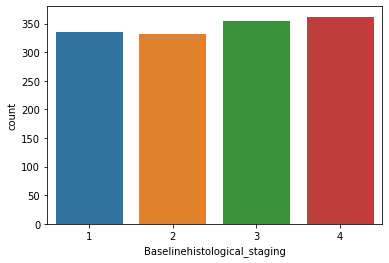

In [9]:
#Visualize this count
sns.countplot(df['Baselinehistological_staging'],label="Count")

In [10]:
df.dtypes

Age                                int64
Gender                             int64
BMI                                int64
Fever                              int64
Nausea/Vomting                     int64
Headache                           int64
Diarrhea                           int64
Fatigue & generalized bone ache    int64
Jaundice                           int64
Epigastric_pain                    int64
WBC                                int64
RBC                                int64
HGB                                int64
Plat                               int64
AST 1                              int64
ALT 1                              int64
ALT4                               int64
ALT 12                             int64
ALT 24                             int64
ALT 36                             int64
ALT 48                             int64
ALT after 24 w                     int64
RNA_Base                           int64
RNA_4                              int64
RNA_12          

In [11]:

#Transform/ Encode the column diagnosis
#dictionary = {'M':1, 'B':0}#Create a dictionary file
#df.diagnosis = [dictionary[item] for item in df.diagnosis] #Change all 'M' to 1 and all 'B' to 0 in the diagnosis col

#Encoding categorical data values (Transforming categorical data/ Strings to integers)
from sklearn.preprocessing import LabelEncoder
labelencoder_Y = LabelEncoder()
df.iloc[:,1]= labelencoder_Y.fit_transform(df.iloc[:,1].values)
print(labelencoder_Y.fit_transform(df.iloc[:,1].values))

[0 0 0 ... 0 0 1]


/usr/local/lib/python3.6/dist-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/usr/local/lib/python3.6/dist-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


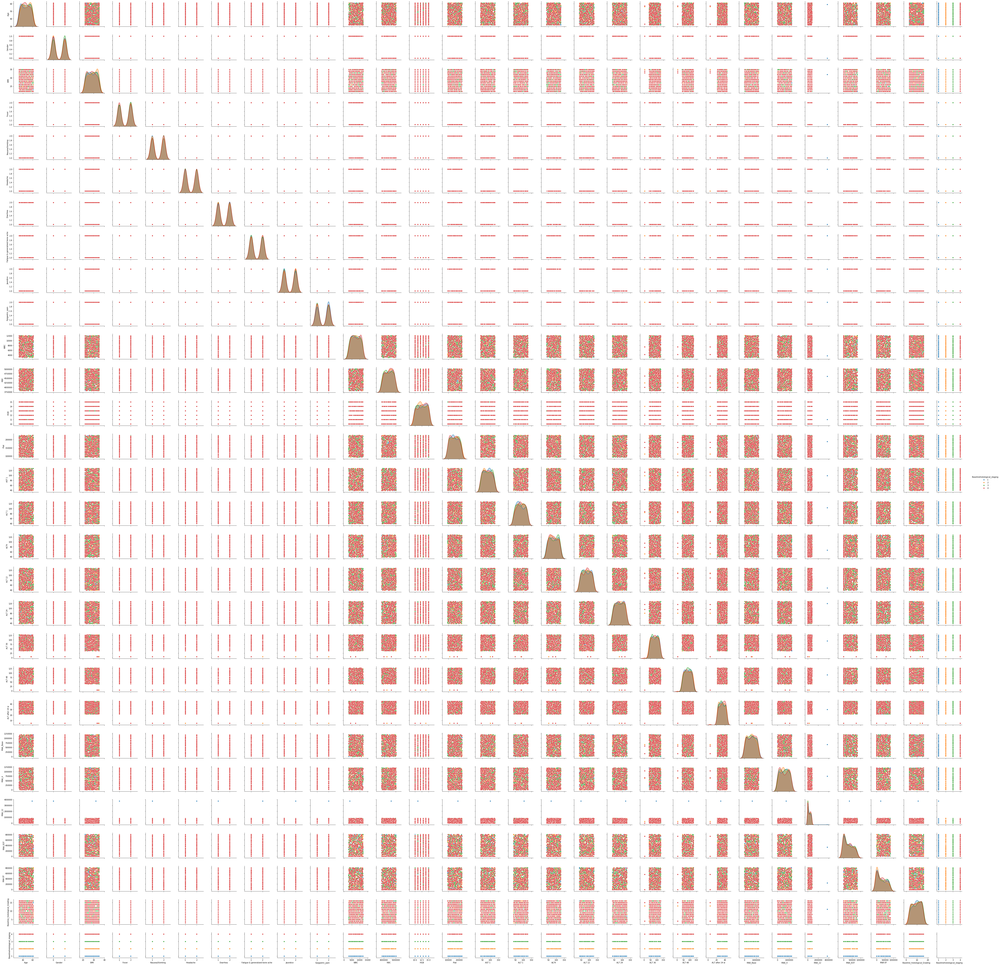

In [12]:
sns.pairplot(df, hue="Baselinehistological_staging")
#sns.pairplot(df.iloc[:,1:6], hue="diagnosis") #plot a sample of the columns

In [13]:
df.head(5)

,Age,Gender,BMI,Fever,Nausea/Vomting,Headache,Diarrhea,Fatigue & generalized bone ache,Jaundice,Epigastric_pain,WBC,RBC,HGB,Plat,AST 1,ALT 1,ALT4,ALT 12,ALT 24,ALT 36,ALT 48,ALT after 24 w,RNA_Base,RNA_4,RNA_12,RNA_EOT,RNA EF,Baseline_histological_Grading,Baselinehistological_staging
0,56,0,35,2,1,1,1,2,2,2,7425,4248807,14,112132,99,84,52,109,81,5,5,5,655330,634536,288194,5,5,13,2
1,46,0,29,1,2,2,1,2,2,1,12101,4429425,10,129367,91,123,95,75,113,57,123,44,40620,538635,637056,336804,31085,4,2
2,57,0,33,2,2,2,2,1,1,1,4178,4621191,12,151522,113,49,95,107,116,5,5,5,571148,661346,5,735945,558829,4,4
3,49,1,33,1,2,1,2,1,2,1,6490,4794631,10,146457,43,64,109,80,88,48,77,33,1041941,449939,585688,744463,582301,10,3
4,59,0,32,1,1,2,1,2,2,2,3661,4606375,11,187684,99,104,67,48,120,94,90,30,660410,738756,3731527,338946,242861,11,1


In [14]:
df.corr()

,Age,Gender,BMI,Fever,Nausea/Vomting,Headache,Diarrhea,Fatigue & generalized bone ache,Jaundice,Epigastric_pain,WBC,RBC,HGB,Plat,AST 1,ALT 1,ALT4,ALT 12,ALT 24,ALT 36,ALT 48,ALT after 24 w,RNA_Base,RNA_4,RNA_12,RNA_EOT,RNA EF,Baseline_histological_Grading,Baselinehistological_staging
Age,1.000000,-0.009934,-0.025353,-0.021208,-0.025024,0.017562,0.043574,-0.007817,0.010285,-0.010817,0.014310,-0.002162,-0.012810,-0.002225,-0.016633,0.005723,0.030260,0.019046,0.002712,-0.008721,0.027557,0.003865,0.022775,-0.012699,0.001578,-0.048702,-0.030297,-0.040705,-0.019599
Gender,-0.009934,1.000000,0.006496,0.021604,-0.036726,-0.023999,0.018161,0.045452,0.000768,-0.025111,0.027290,-0.000959,-0.001246,0.019299,-0.013078,0.022450,-0.008720,0.009973,-0.015919,0.006087,-0.020324,0.010184,-0.013371,-0.023315,-0.031379,0.035272,-0.015292,0.014559,0.011955
BMI,-0.025353,0.006496,1.000000,-0.017581,0.005801,-0.007851,-0.026094,-0.007296,-0.071379,0.008205,0.036721,-0.004922,0.057987,-0.003093,0.001806,0.034037,0.001416,-0.059659,0.007909,-0.029995,-0.007866,-0.021412,-0.016418,0.036864,-0.009190,-0.021428,-0.044901,-0.023045,-0.057259
Fever,-0.021208,0.021604,-0.017581,1.000000,-0.005214,0.019751,-0.019661,-0.003545,-0.005124,-0.016862,-0.035046,-0.029645,-0.017406,-0.005403,-0.008627,0.023238,-0.017145,-0.022705,-0.048104,-0.007830,0.001238,0.000424,-0.002480,0.000727,0.019957,0.017028,-0.012406,-0.031563,-0.030975
Nausea/Vomting,-0.025024,-0.036726,0.005801,-0.005214,1.000000,0.019536,0.009361,-0.032481,0.000711,-0.051306,-0.024494,0.017944,0.013441,0.086394,0.009325,0.056077,-0.020932,-0.027007,0.038891,0.023808,-0.041491,0.011838,0.007975,-0.029511,-0.011250,0.005395,0.020944,-0.056782,0.054906
Headache,0.017562,-0.023999,-0.007851,0.019751,0.019536,1.000000,0.019536,-0.016624,0.007960,0.028224,-0.040385,0.010071,-0.029311,-0.022106,0.004822,0.050408,0.037748,0.027286,0.010193,0.017464,-0.003555,-0.003899,0.022810,-0.041613,0.011729,-0.008541,-0.007524,-0.011241,-0.001996
Diarrhea,0.043574,0.018161,-0.026094,-0.019661,0.009361,0.019536,1.000000,-0.026704,-0.016618,0.020899,0.000169,-0.013614,-0.061591,0.028319,-0.036636,0.059142,0.025787,-0.065305,-0.021249,0.008487,-0.018741,0.001831,0.018340,-0.000089,-0.012324,0.021348,0.042433,0.031891,-0.005639
Fatigue & generalized bone ache,-0.007817,0.045452,-0.007296,-0.003545,-0.032481,-0.016624,-0.026704,1.000000,0.007947,0.036842,-0.014814,-0.021965,0.000743,-0.000066,0.025601,-0.002682,-0.072114,0.012596,0.000775,0.021214,-0.008982,0.035975,-0.006124,-0.050635,0.031220,0.013778,0.006348,-0.022027,0.014563
Jaundice,0.010285,0.000768,-0.071379,-0.005124,0.000711,0.007960,-0.016618,0.007947,1.000000,-0.025289,0.030286,-0.012878,-0.025192,-0.036599,0.014746,0.012601,0.015213,-0.008993,-0.007831,0.007296,0.016253,-0.018412,0.028796,-0.008940,0.033608,0.037720,0.024757,-0.007770,0.020219
Epigastric_pain,-0.010817,-0.025111,0.008205,-0.016862,-0.051306,0.028224,0.020899,0.036842,-0.025289,1.000000,0.039267,-0.038864,-0.001882,-0.050923,0.036972,0.022372,-0.066064,0.018051,-0.017690,0.032989,0.002453,0.029835,0.003261,0.005586,0.031316,0.046650,0.081423,-0.005633,-0.052110


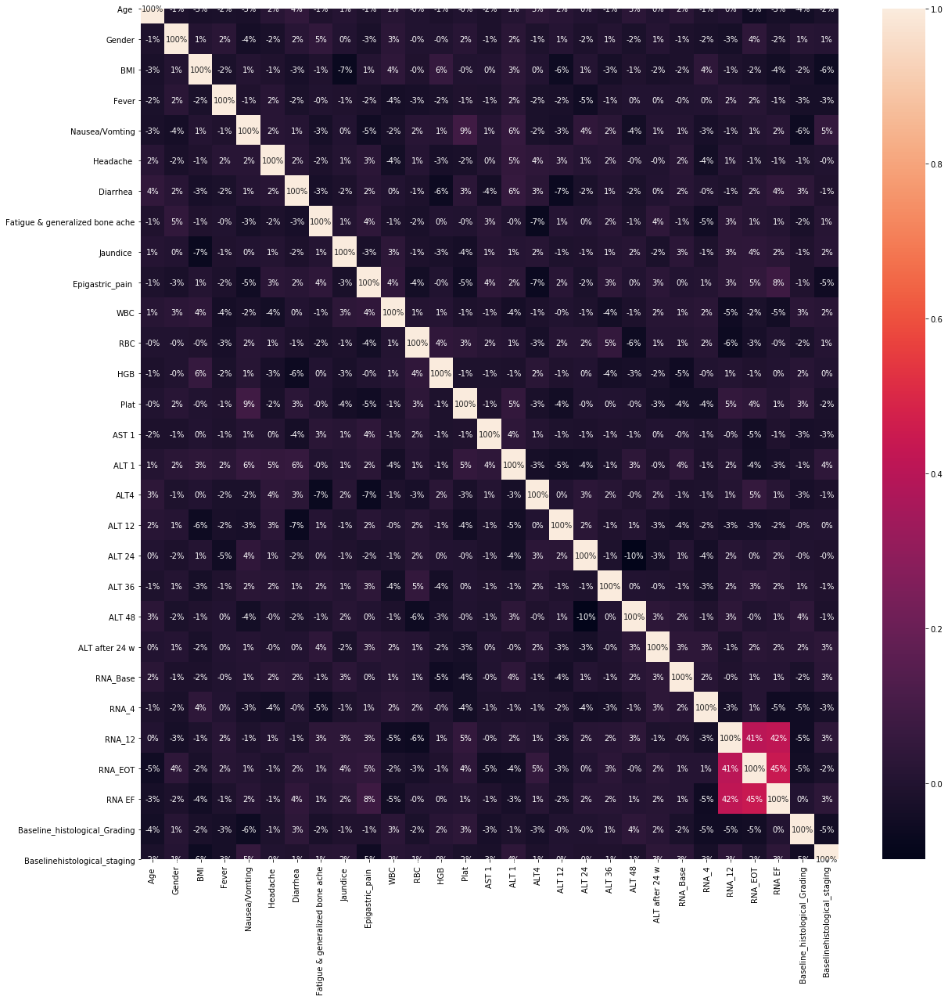

In [15]:
#Visualize the correlation 
#NOTE: To see the numbers within the cell ==>  sns.heatmap(df.corr(), annot=True)
plt.figure(figsize=(20,20))  #This is used to change the size of the figure/ heatmap
sns.heatmap(df.corr(), annot=True, fmt='.0%')
#plt.figure(figsize=(10,10)) #This is used to change the size of the figure/ heatmap
#sns.heatmap(df.iloc[:,1:12].corr(), annot=True, fmt='.0%') #Get a heap map of 11 columns, index 1-11, note index 0 is just the id column and is left out.

In [0]:
X = df.iloc[:, 2:31].values #Notice I started from index  2 to 31, essentially removing the id column & diagnosis
Y = df.iloc[:, 1].values #Get the target variable 'diagnosis' located at index=1

In [0]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [0]:
#Feature Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [0]:
#Create a function within many Machine Learning Models
def models(X_train,Y_train):
  
  #Using Logistic Regression Algorithm to the Training Set
  from sklearn.linear_model import LogisticRegression
  log = LogisticRegression(random_state = 0)
  log.fit(X_train, Y_train)
  
  #Using KNeighborsClassifier Method of neighbors class to use Nearest Neighbor algorithm
  from sklearn.neighbors import KNeighborsClassifier
  knn = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
  knn.fit(X_train, Y_train)

  #Using SVC method of svm class to use Support Vector Machine Algorithm
  from sklearn.svm import SVC
  svc_lin = SVC(kernel = 'linear', random_state = 0)
  svc_lin.fit(X_train, Y_train)

  #Using SVC method of svm class to use Kernel SVM Algorithm
  from sklearn.svm import SVC
  svc_rbf = SVC(kernel = 'rbf', random_state = 0)
  svc_rbf.fit(X_train, Y_train)

  #Using GaussianNB method of naïve_bayes class to use Naïve Bayes Algorithm
  from sklearn.naive_bayes import GaussianNB
  gauss = GaussianNB()
  gauss.fit(X_train, Y_train)

  #Using DecisionTreeClassifier of tree class to use Decision Tree Algorithm
  from sklearn.tree import DecisionTreeClassifier
  tree = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
  tree.fit(X_train, Y_train)

  #Using RandomForestClassifier method of ensemble class to use Random Forest Classification algorithm
  from sklearn.ensemble import RandomForestClassifier
  forest = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
  forest.fit(X_train, Y_train)
  
  #print model accuracy on the training data.
  print('[0]Logistic Regression Training Accuracy:', log.score(X_train, Y_train))
  print('[1]K Nearest Neighbor Training Accuracy:', knn.score(X_train, Y_train))
  print('[2]Support Vector Machine (Linear Classifier) Training Accuracy:', svc_lin.score(X_train, Y_train))
  print('[3]Support Vector Machine (RBF Classifier) Training Accuracy:', svc_rbf.score(X_train, Y_train))
  print('[4]Gaussian Naive Bayes Training Accuracy:', gauss.score(X_train, Y_train))
  print('[5]Decision Tree Classifier Training Accuracy:', tree.score(X_train, Y_train))
  print('[6]Random Forest Classifier Training Accuracy:', forest.score(X_train, Y_train))
  
  return log, knn, svc_lin, svc_rbf, gauss, tree, forest

In [20]:

model = models(X_train,Y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


[0]Logistic Regression Training Accuracy: 0.5674373795761078
[1]K Nearest Neighbor Training Accuracy: 0.7061657032755299
[2]Support Vector Machine (Linear Classifier) Training Accuracy: 0.571290944123314
[3]Support Vector Machine (RBF Classifier) Training Accuracy: 0.8564547206165704
[4]Gaussian Naive Bayes Training Accuracy: 0.5741811175337187
[5]Decision Tree Classifier Training Accuracy: 1.0
[6]Random Forest Classifier Training Accuracy: 0.98747591522158


In [21]:

#Show the confusion matrix and accuracy for all of the models on the test data
#Classification accuracy is the ratio of correct predictions to total predictions made.
from sklearn.metrics import confusion_matrix
for i in range(len(model)):
  cm = confusion_matrix(Y_test, model[i].predict(X_test))
  
  TN = cm[0][0]
  TP = cm[1][1]
  FN = cm[1][0]
  FP = cm[0][1]
  
  print(cm)
  print('Model[{}] Testing Accuracy = "{}!"'.format(i,  (TP + TN) / (TP + TN + FN + FP)))
  print()# Print a new line

[[106  71]
 [109  61]]
Model[0] Testing Accuracy = "0.4812680115273775!"

[[92 85]
 [97 73]]
Model[1] Testing Accuracy = "0.4755043227665706!"

[[106  71]
 [105  65]]
Model[2] Testing Accuracy = "0.49279538904899134!"

[[92 85]
 [96 74]]
Model[3] Testing Accuracy = "0.4783861671469741!"

[[109  68]
 [106  64]]
Model[4] Testing Accuracy = "0.49855907780979825!"

[[95 82]
 [95 75]]
Model[5] Testing Accuracy = "0.4899135446685879!"

[[118  59]
 [109  61]]
Model[6] Testing Accuracy = "0.515850144092219!"



In [22]:
#Show other ways to get the classification accuracy & other metrics 

from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

for i in range(len(model)):
  print('Model ',i)
  #Check precision, recall, f1-score
  print( classification_report(Y_test, model[i].predict(X_test)) )
  #Another way to get the models accuracy on the test data
  print( accuracy_score(Y_test, model[i].predict(X_test)))
  print()#Print a new line

Model  0
              precision    recall  f1-score   support

           0       0.49      0.60      0.54       177
           1       0.46      0.36      0.40       170

    accuracy                           0.48       347
   macro avg       0.48      0.48      0.47       347
weighted avg       0.48      0.48      0.47       347

0.4812680115273775

Model  1
              precision    recall  f1-score   support

           0       0.49      0.52      0.50       177
           1       0.46      0.43      0.45       170

    accuracy                           0.48       347
   macro avg       0.47      0.47      0.47       347
weighted avg       0.47      0.48      0.47       347

0.4755043227665706

Model  2
              precision    recall  f1-score   support

           0       0.50      0.60      0.55       177
           1       0.48      0.38      0.42       170

    accuracy                           0.49       347
   macro avg       0.49      0.49      0.49       347
weighte

In [24]:

#Print Prediction of Random Forest Classifier model
pred = model[6].predict(X_test)
print(pred)

#Print a space
print()

#Print the actual values
print(Y_test)

[1 1 1 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 1 0 1 1 0 0 1 0
 1 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 1 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 1 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 1 0
 0 0 0 0 1 1 0 0 0 1 1 0 0 0 0 0 1 1 1 1 1 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0
 1 0 0 0 0 0 1 0 0 1 1 0 0 0 1 0 0 1 1 0 0 0 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0
 0 1 0 0 0 0 1 1 0 0 1 0 1 1 1 0 0 0 0 0 0 1 0 1 1 0 0 1 0 1 1 1 0 1 1 0 0
 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 1 1 1 0 0 0 1 0 1 0 0 1 0 1 1 0
 1 0 1 1 0 0 0 0 0 1 1 0 1 0 0 0 0 1 0 1 0 0 0 1 1 1 0 1 0 0 1 0 1 1 1 0 0
 1 0 1 1 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 1 1
 0 0 1 0 0 0 1 0 1 0 1 0 0 0]

[0 1 0 1 0 0 0 0 1 1 1 0 0 0 0 0 1 0 1 0 1 0 1 1 0 0 1 0 1 1 0 0 1 0 1 1 1
 0 0 1 1 0 0 1 1 1 1 1 0 0 1 1 0 1 1 0 0 0 1 0 0 1 0 1 1 0 1 0 0 0 0 1 1 0
 0 1 1 1 0 1 1 0 0 1 0 0 0 0 0 0 1 1 1 1 1 1 1 0 0 1 1 0 0 0 0 1 1 1 0 1 1
 0 0 0 0 0 1 0 0 1 1 1 0 1 1 1 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 1 0 0 

In [0]:
# Create separate object for target variable
y = df.Baselinehistological_staging

# Create separate object for input features
X = df.drop('Gender', axis=1)

In [0]:
# Split X and y into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    random_state=1234,
                                                    stratify=df.Baselinehistological_staging)

In [30]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(1108, 28) (277, 28) (1108,) (277,)


In [0]:

train_mean = X_train.mean()
train_std = X_train.std()

In [0]:
X_train = (X_train - train_mean) / train_std

In [0]:
## Note: We use train_mean and train_std_dev to standardize test data set
X_test = (X_test - train_mean) / train_std

In [37]:
## Building the model again with the best hyperparameters
model = DecisionTreeClassifier(min_samples_split=2, min_samples_leaf=6, max_depth=4)
model.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=4,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=6, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [38]:
indices = np.argsort(-model.feature_importances_)
print("The features in order of importance are:")
print(50*'-')
for feature in X.columns[indices]:
    print(feature)

The features in order of importance are:
--------------------------------------------------
Baselinehistological_staging
RNA EF
RNA_EOT
RNA_12
RNA_4
RNA_Base
ALT after 24 w
ALT 48
ALT 36
ALT 24
ALT 12
ALT4
ALT 1
Age 
Plat
HGB
RBC
WBC
Epigastric_pain 
Jaundice 
Fatigue & generalized bone ache
Diarrhea 
Headache 
Nausea/Vomting
Fever
BMI
Baseline_histological_Grading
AST 1
